In [90]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import matplotlib as mpl
import seaborn as sns
import numpy as np
from IPython.display import HTML


In [ ]:
## The Header must be
# time,  theta1_actual,  omega1_actual,  theta2_actual,  omega2_actual, theta1_predicted,  omega1_predicted,  theta2_predicted,  omega2_predicted

# Read CSV files from the tests
#CSV filed need to be in the same directory as the notebook
# # #Stable region
filename1 = 'test_Datadriven_Benchmark_2002x1_one_init'
filename2 = 'test_Energy_Conserv_2002x1_one_init'
filename3 = 'test_Lagrange_2002x1_one_init'

#Chaotic region
# filename1 = 'test_chaotic_Datadriven_Benchmark_2002x1_one_init'
# filename2 = 'test_chaotic_Energy_Conserv_2002x1_one_init'
# filename3 = 'test_chaotic_Lagrange_2002x1_one_init'


data_driven = pd.read_csv(f'{filename1}.csv')
energy_conservation = pd.read_csv(f'{filename2}.csv')
lagrange = pd.read_csv(f'{filename3}.csv')

In [92]:
energy_conservation.head()

,time,theta1_actual,omega1_actual,theta2_actual,omega2_actual,theta1_predicted,omega1_predicted,theta2_predicted,omega2_predicted
0,0.000000,-0.872665,0.000000,2.443461,0.000000,-0.872665,0.000000,2.443461,0.000000
1,0.033333,-0.869476,0.191214,2.444359,0.053864,-0.869476,0.191214,2.444359,0.053864
2,0.066667,-0.859928,0.381436,2.447050,0.107585,-0.859928,0.381436,2.447050,0.107585
3,0.100000,-0.844070,0.569606,2.451526,0.160797,-0.844070,0.569606,2.451526,0.160797
4,0.133333,-0.821990,0.754529,2.457756,0.212704,-0.821990,0.754529,2.457756,0.212704


In [93]:
def calculate_errors(data):
    
    # Deviations between prediciton and actual testvalue
    data_errors = {
        'theta1': data['theta1_actual'] - data['theta1_predicted'],
        'theta2': data['theta2_actual'] - data['theta2_predicted'],
        'omega1': data['omega1_actual'] - data['omega1_predicted'],
        'omega2': data['omega2_actual'] - data['omega2_predicted'],
    }

    # absolute error
    absolute_data_errors = {
        'theta1': abs(data['theta1_actual'] - data['theta1_predicted']),
        'theta2': abs(data['theta2_actual'] - data['theta2_predicted']),
        'omega1': abs(data['omega1_actual'] - data['omega1_predicted']),
        'omega2': abs(data['omega2_actual'] - data['omega2_predicted']),
    }

    # error in percent
    percent_data_errors = {
        'theta1': abs(abs(data['theta1_actual']) - abs(data['theta1_predicted'])) / data['theta1_actual'] * 100,
        'theta2': abs(abs(data['theta2_actual']) - abs(data['theta2_predicted'])) / data['theta2_actual'] * 100,
        'omega1': abs(abs(data['omega1_actual']) - abs(data['omega1_predicted'])) / data['omega1_actual'] * 100,
        'omega2': abs(abs(data['omega2_actual']) - abs(data['omega2_predicted'])) / data['omega2_actual'] * 100,
    }
    
    data_errors_df = pd.DataFrame(data_errors)
    absolute_data_errors_df = pd.DataFrame(absolute_data_errors)
    percent_data_errors_df = pd.DataFrame(percent_data_errors)

    return data_errors, absolute_data_errors, percent_data_errors, data_errors_df, absolute_data_errors_df, percent_data_errors_df

In [94]:
data_driven_errors, data_driven_absolute_errors, percent_data_driven_errors, data_driven_errors_df, data_driven_absolute_errors_df, percent_data_driven_errors_df = calculate_errors(data_driven)
energy_conservation_errors, energy_conservation_absolute_errors, percent_energy_conservation_errors, energy_conservation_errors_df, energy_conservation_absolute_errors_df, percent_energy_conservation_errors_df = calculate_errors(energy_conservation)
lagrange_errors, lagrange_absolute_errors, percent_lagrange_errors, lagrange_errors_df, lagrange_absolute_errors_df, percent_lagrange_errors_df = calculate_errors(lagrange)

In [95]:
def boxplotter(data_driven_errors, energy_conservation_errors, lagrange_errors, title):
    # Prepare the error data for the boxplot
    error_data = pd.DataFrame({
        'Modelle': ['Daten basiert'] * len(data_driven_errors['theta1']) + ['Energieerhaltung'] * len(energy_conservation_errors['theta1']) + ['Lagrange'] * len(lagrange_errors['theta1']),
        'theta1_error': list(data_driven_errors['theta1']) + list(energy_conservation_errors['theta1']) + list(lagrange_errors['theta1']),
        'theta2_error': list(data_driven_errors['theta2']) + list(energy_conservation_errors['theta2']) + list(lagrange_errors['theta2']),
        'theta1dot_error': list(data_driven_errors['omega1']) + list(energy_conservation_errors['omega1']) + list(lagrange_errors['omega1']),
        'theta2dot_error': list(data_driven_errors['omega2']) + list(energy_conservation_errors['omega2']) + list(lagrange_errors['omega2']),
    })

    # rename the variable for the plot
    error_data = error_data.rename(columns={
        'theta1_error': r'$\theta_1$',
        'theta2_error': r'$\theta_2$',
        'theta1dot_error': r'$\dot{\theta}_1$',
        'theta2dot_error': r'$\dot{\theta}_2$'
    })

    # restructure the error data to fit for the Boxplot
    error_data_melted = pd.melt(error_data, id_vars=['Modelle'], value_vars=[r'$\theta_1$', r'$\theta_2$', r'$\dot{\theta}_1$', r'$\dot{\theta}_2$'],
                                var_name='Vorhergesagte Werte', value_name='Error')

    # create Boxplot
    plt.figure(figsize=(10, 5))
    #Setting the Fontstyle
    plt.rcParams.update({'font.size': 14})
    plt.rcParams.update({'font.family': 'Times New Roman'})

    sns.boxplot(x='Vorhergesagte Werte', y='Error', hue='Modelle', data=error_data_melted)
    plt.title(title, fontsize=16)
    plt.ylabel(r'Fehler: $\theta_i$ in rad und $\dot{\theta}_i$ in rad/s', fontsize=14)
    plt.savefig("plot.svg", format="svg", bbox_inches='tight')
    plt.show()
    
    return

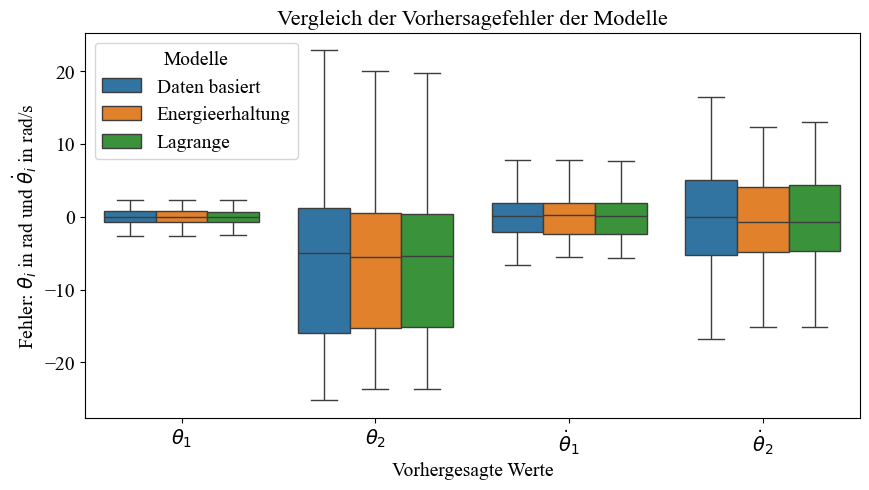

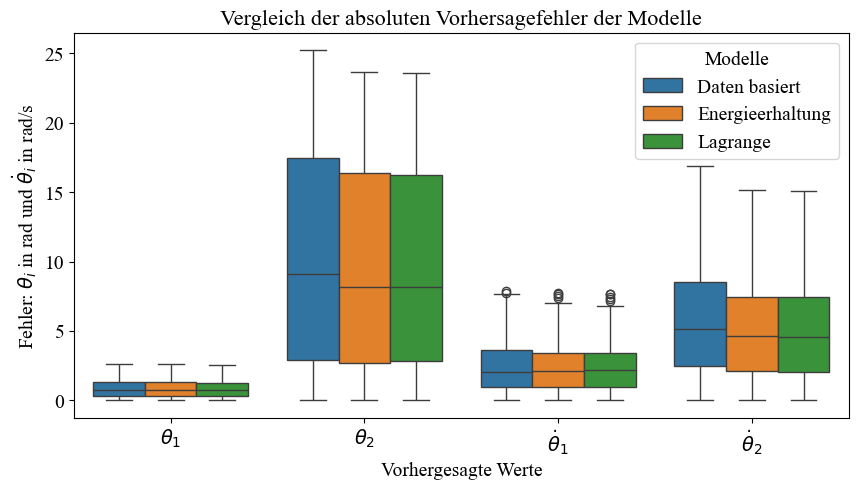

In [96]:
title = 'Vergleich der Vorhersagefehler der Modelle'
boxplotter(data_driven_errors, energy_conservation_errors, lagrange_errors, title)
title2 = 'Vergleich der absoluten Vorhersagefehler der Modelle'
boxplotter(data_driven_absolute_errors, energy_conservation_absolute_errors, lagrange_absolute_errors, title2)

In [97]:
#Calculating the average errorr in every step of theta1, theta2, omega1 and omega2
time_steps = data_driven[['time']]

# For theta
theta_data_driven_errors_absolute_values_combined = data_driven_errors_df[['theta1', 'theta2']].abs().mean(axis=1)
theta_data_driven_errors_values_combined = data_driven_errors_df[['theta1', 'theta2']].mean(axis=1)

theta_energy_conservation_errors_absolute_values_combined = energy_conservation_errors_df[['theta1', 'theta2']].abs().mean(axis=1)
theta_energy_conservation_errors_values_combined = energy_conservation_errors_df[['theta1', 'theta2']].mean(axis=1)

theta_lagrange_errors_absolute_values_combined = lagrange_errors_df[['theta1', 'theta2']].abs().mean(axis=1)
theta_lagrange_errors_values_combined = lagrange_errors_df[['theta1', 'theta2']].mean(axis=1)

# For omega
Omega_data_driven_errors_absolute_values_combined = data_driven_errors_df[['omega1', 'omega2']].abs().mean(axis=1)
Omega_data_driven_errors_values_combined = data_driven_errors_df[['omega1', 'omega2']].mean(axis=1)

Omega_energy_conservation_errors_absolute_values_combined = energy_conservation_errors_df[['omega1', 'omega2']].abs().mean(axis=1)
Omega_energy_conservation_errors_values_combined = energy_conservation_errors_df[['omega1', 'omega2']].mean(axis=1)

Omega_lagrange_errors_absolute_values_combined = lagrange_errors_df[['omega1', 'omega2']].abs().mean(axis=1)
Omega_lagrange_errors_values_combined = lagrange_errors_df[['omega1', 'omega2']].mean(axis=1)

In [98]:
# Calculation of the moving average
def moving_average(data, window_size):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

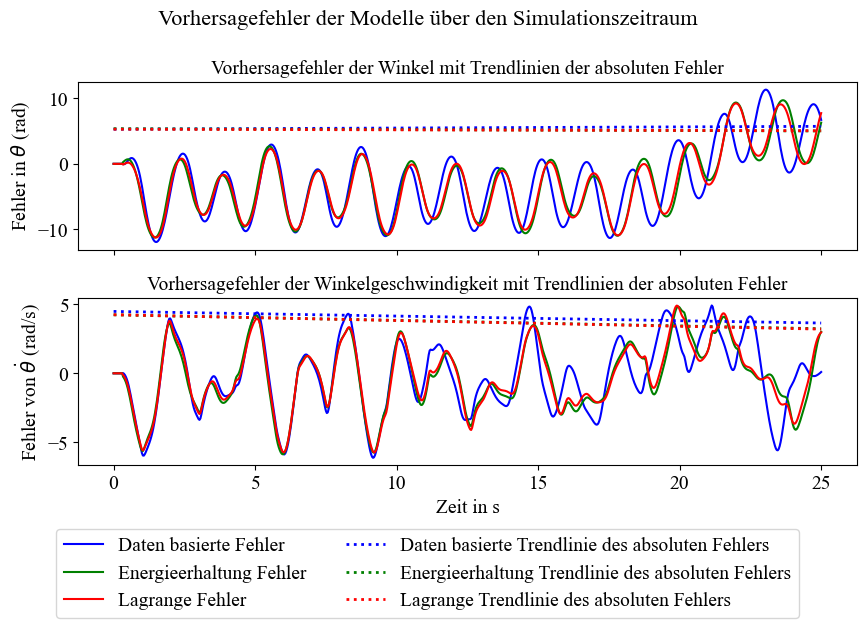

In [99]:
# Create figure for the subplots
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(9, 6), sharex=True)
fig.suptitle('Vorhersagefehler der Modelle über den Simulationszeitraum', fontsize=16)

# Plot für theta (not absolute Error)
ax1.set_title('Vorhersagefehler der Winkel mit Trendlinien der absoluten Fehler', fontsize=14)
ax1.plot(time_steps, theta_data_driven_errors_values_combined, label='Daten basierte Fehler', color='blue')
ax1.plot(time_steps, theta_energy_conservation_errors_values_combined, label='Energieerhaltung Fehler', color='green')
ax1.plot(time_steps, theta_lagrange_errors_values_combined, label='Lagrange Fehler', color='red')

time_steps = time_steps.values #or time_steps.to_numpy()
time_steps = time_steps.reshape(-1)

# Trend of theta
z_data_driven = np.polyfit(time_steps, theta_data_driven_errors_absolute_values_combined, 1)
p_data_driven = np.poly1d(z_data_driven)
ax1.plot(time_steps, p_data_driven(time_steps), color='blue', linestyle=':', linewidth=2, label=f'Daten basierte Trendlinie des absoluten Fehlers')
# ax1.plot(time_steps, p_data_driven(time_steps), color='blue', linestyle=':', linewidth=2, label=f'Daten basierte Trendlinie des absoluten Fehlers: {z_data_driven[0]:.2f}x + {z_data_driven[1]:.2f}')

z_energy = np.polyfit(time_steps, theta_energy_conservation_errors_absolute_values_combined, 1)
p_energy = np.poly1d(z_energy)
ax1.plot(time_steps, p_energy(time_steps), color='green', linestyle=':', linewidth=2, label=f'Energieerhaltung Trendlinie des absoluten Fehlers')
# ax1.plot(time_steps, p_energy(time_steps), color='green', linestyle=':', linewidth=2, label=f'Energieerhaltung Trendlinie des absoluten Fehlers: {z_energy[0]:.2f}x + {z_energy[1]:.2f}')

z_lagrange = np.polyfit(time_steps, theta_lagrange_errors_absolute_values_combined, 1)
p_lagrange = np.poly1d(z_lagrange)
ax1.plot(time_steps, p_lagrange(time_steps), color='red', linestyle=':', linewidth=2, label=f'Lagrange Trendlinie des absoluten Fehlers')
# ax1.plot(time_steps, p_lagrange(time_steps), color='red', linestyle=':', linewidth=2, label=f'Lagrange Trendlinie des absoluten Fehlers: {z_lagrange[0]:.2f}x + {z_lagrange[1]:.2f}')

ax1.set_xlabel('')  
ax1.set_ylabel(r'Fehler in $\theta$ (rad)', fontsize=14)

# Plot for omega (not absolute errorr)
ax2.set_title('Vorhersagefehler der Winkelgeschwindigkeit mit Trendlinien der absoluten Fehler', fontsize=14)
ax2.plot(time_steps, Omega_data_driven_errors_values_combined, label='Daten basierte Fehler', color='blue')
ax2.plot(time_steps, Omega_energy_conservation_errors_values_combined, label='Energieerhaltung Fehler', color='green')
ax2.plot(time_steps, Omega_lagrange_errors_values_combined, label='Lagrange Fehler', color='red')

# Trend for omega
z_data_driven_omega = np.polyfit(time_steps, Omega_data_driven_errors_absolute_values_combined, 1)
p_data_driven_omega = np.poly1d(z_data_driven_omega)
ax2.plot(time_steps, p_data_driven_omega(time_steps), color='blue', linestyle=':', linewidth=2, label=f'Daten basierte Trendlinie des absoluten Fehlers')
# ax2.plot(time_steps, p_data_driven_omega(time_steps), color='blue', linestyle=':', linewidth=2, label=f'Daten basierte Trendlinie des absoluten Fehlers: {z_data_driven_omega[0]:.2f}x + {z_data_driven_omega[1]:.2f}')

z_energy_omega = np.polyfit(time_steps, Omega_energy_conservation_errors_absolute_values_combined, 1)
p_energy_omega = np.poly1d(z_energy_omega)
ax2.plot(time_steps, p_energy_omega(time_steps), color='green', linestyle=':', linewidth=2, label=f'Energieerhaltung Trendlinie des absoluten Fehlers')
# ax2.plot(time_steps, p_energy_omega(time_steps), color='green', linestyle=':', linewidth=2, label=f'Energieerhaltung Trendlinie des absoluten Fehlers: {z_energy_omega[0]:.2f}x + {z_energy_omega[1]:.2f}')

z_lagrange_omega = np.polyfit(time_steps, Omega_lagrange_errors_absolute_values_combined, 1)
p_lagrange_omega = np.poly1d(z_lagrange_omega)
ax2.plot(time_steps, p_lagrange_omega(time_steps), color='red', linestyle=':', linewidth=2, label=f'Lagrange Trendlinie des absoluten Fehlers')
# ax2.plot(time_steps, p_lagrange_omega(time_steps), color='red', linestyle=':', linewidth=2, label=f'Lagrange Trendlinie des absoluten Fehlers: {z_lagrange_omega[0]:.2f}x + {z_lagrange_omega[1]:.2f}')


ax2.set_xlabel('Zeit in s', fontsize=14)
ax2.set_ylabel(r'Fehler von $\dot{\theta}$ (rad/s)', fontsize=14)

#create separate legend for the plot
handles, labels = ax1.get_legend_handles_labels()
fig.legend(handles, labels, ncol=2, loc='lower center', bbox_to_anchor=(0.5, -0.05), fontsize=14)
# fit the legend into the plot
plt.tight_layout(rect=[0, 0.1, 1, 1])  # rect=[left, bottom, right, top]

plt.show()

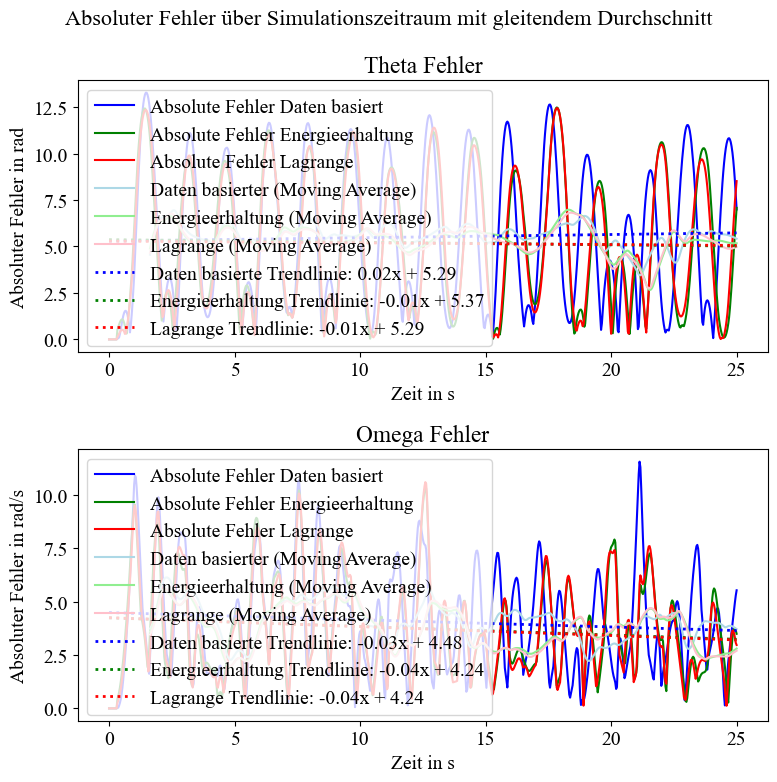

In [100]:
# Erstellen der Figur und der Subplots
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(8, 8))
fig.suptitle('Absoluter Fehler über Simulationszeitraum mit gleitendem Durchschnitt', fontsize=16)

# Plot für theta
ax1.set_title('Theta Fehler')
ax1.plot(time_steps, theta_data_driven_errors_absolute_values_combined, label='Absolute Fehler Daten basiert', color='blue')
ax1.plot(time_steps, theta_energy_conservation_errors_absolute_values_combined, label='Absolute Fehler Energieerhaltung', color='green')
ax1.plot(time_steps, theta_lagrange_errors_absolute_values_combined, label='Absolute Fehler Lagrange', color='red')

# Gleitender Durchschnitt für theta
window_size = 50
data_driven_smoothed = moving_average(theta_data_driven_errors_absolute_values_combined, window_size)
energy_smoothed = moving_average(theta_energy_conservation_errors_absolute_values_combined, window_size)
lagrange_smoothed = moving_average(theta_lagrange_errors_absolute_values_combined, window_size)
time_steps_smoothed = time_steps[window_size-1:]

ax1.plot(time_steps_smoothed, data_driven_smoothed, label='Daten basierter (Moving Average)', color='lightblue')
ax1.plot(time_steps_smoothed, energy_smoothed, label='Energieerhaltung (Moving Average)', color='lightgreen')
ax1.plot(time_steps_smoothed, lagrange_smoothed, label='Lagrange (Moving Average)', color='pink')

# Trendlinien für theta
z_data_driven = np.polyfit(time_steps, theta_data_driven_errors_absolute_values_combined, 1)
p_data_driven = np.poly1d(z_data_driven)
ax1.plot(time_steps, p_data_driven(time_steps), color='blue', linestyle=':', linewidth=2, label=f'Daten basierte Trendlinie: {z_data_driven[0]:.2f}x + {z_data_driven[1]:.2f}')

z_energy = np.polyfit(time_steps, theta_energy_conservation_errors_absolute_values_combined, 1)
p_energy = np.poly1d(z_energy)
ax1.plot(time_steps, p_energy(time_steps), color='green', linestyle=':', linewidth=2, label=f'Energieerhaltung Trendlinie: {z_energy[0]:.2f}x + {z_energy[1]:.2f}')

z_lagrange = np.polyfit(time_steps, theta_lagrange_errors_absolute_values_combined, 1)
p_lagrange = np.poly1d(z_lagrange)
ax1.plot(time_steps, p_lagrange(time_steps), color='red', linestyle=':', linewidth=2, label=f'Lagrange Trendlinie: {z_lagrange[0]:.2f}x + {z_lagrange[1]:.2f}')

ax1.set_xlabel('Zeit in s', fontsize=14)
ax1.set_ylabel('Absoluter Fehler in rad', fontsize=14)
ax1.legend()

# Plot für omega
ax2.set_title('Omega Fehler')
ax2.plot(time_steps, Omega_data_driven_errors_absolute_values_combined, label='Absolute Fehler Daten basiert', color='blue')
ax2.plot(time_steps, Omega_energy_conservation_errors_absolute_values_combined, label='Absolute Fehler Energieerhaltung', color='green')
ax2.plot(time_steps, Omega_lagrange_errors_absolute_values_combined, label='Absolute Fehler Lagrange', color='red')

# moving average of omega
data_driven_smoothed_omega = moving_average(Omega_data_driven_errors_absolute_values_combined, window_size)
energy_smoothed_omega = moving_average(Omega_energy_conservation_errors_absolute_values_combined, window_size)
lagrange_smoothed_omega = moving_average(Omega_lagrange_errors_absolute_values_combined, window_size)

ax2.plot(time_steps_smoothed, data_driven_smoothed_omega, label='Daten basierter (Moving Average)', color='lightblue')
ax2.plot(time_steps_smoothed, energy_smoothed_omega, label='Energieerhaltung (Moving Average)', color='lightgreen')
ax2.plot(time_steps_smoothed, lagrange_smoothed_omega, label='Lagrange (Moving Average)', color='pink')

# Trend for omega
z_data_driven_omega = np.polyfit(time_steps, Omega_data_driven_errors_absolute_values_combined, 1)
p_data_driven_omega = np.poly1d(z_data_driven_omega)
ax2.plot(time_steps, p_data_driven_omega(time_steps), color='blue', linestyle=':', linewidth=2, label=f'Daten basierte Trendlinie: {z_data_driven_omega[0]:.2f}x + {z_data_driven_omega[1]:.2f}')

z_energy_omega = np.polyfit(time_steps, Omega_energy_conservation_errors_absolute_values_combined, 1)
p_energy_omega = np.poly1d(z_energy_omega)
ax2.plot(time_steps, p_energy_omega(time_steps), color='green', linestyle=':', linewidth=2, label=f'Energieerhaltung Trendlinie: {z_energy_omega[0]:.2f}x + {z_energy_omega[1]:.2f}')

z_lagrange_omega = np.polyfit(time_steps, Omega_lagrange_errors_absolute_values_combined, 1)
p_lagrange_omega = np.poly1d(z_lagrange_omega)
ax2.plot(time_steps, p_lagrange_omega(time_steps), color='red', linestyle=':', linewidth=2, label=f'Lagrange Trendlinie: {z_lagrange_omega[0]:.2f}x + {z_lagrange_omega[1]:.2f}')

ax2.set_xlabel('Zeit in s', fontsize=14)
ax2.set_ylabel('Absoluter Fehler in rad/s', fontsize=14)
ax2.legend()

plt.tight_layout()
plt.show()

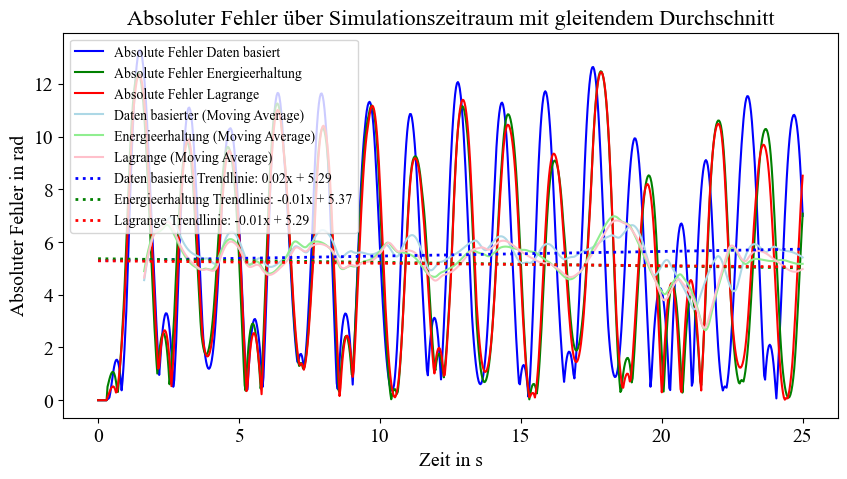

In [101]:
plt.figure(figsize=(10, 5))
plt.title('Absoluter Fehler über Simulationszeitraum mit gleitendem Durchschnitt', fontsize=16)
plt.rcParams.update({'font.size': 10})
plt.rcParams.update({'font.family': 'Times New Roman'})
## Plotting the actual data

# Data drvien error
plt.plot(time_steps, theta_data_driven_errors_absolute_values_combined, label='Absolute Fehler Daten basiert', color='blue')
# plt.plot(time_steps, theta_data_driven_errors_values_combined, label='Data Driven Fehler', color='lightblue')

# Energy Conservation error
plt.plot(time_steps, theta_energy_conservation_errors_absolute_values_combined, label='Absolute Fehler Energieerhaltung', color='green')
# plt.plot(time_steps, theta_energy_conservation_errors_values_combined, label='Energy Conservation Fehler', color='lightgreen')

# Lagrange error
plt.plot(time_steps, theta_lagrange_errors_absolute_values_combined, label='Absolute Fehler Lagrange', color='red')
# plt.plot(time_steps, theta_lagrange_errors_values_combined, label='Lagrange Fehler', color='pink')

# Calculating the moving Average with a window size of 50
window_size = 50

data_driven_smoothed = moving_average(theta_data_driven_errors_absolute_values_combined, window_size)
energy_smoothed = moving_average(theta_energy_conservation_errors_absolute_values_combined, window_size)
lagrange_smoothed = moving_average(theta_lagrange_errors_absolute_values_combined, window_size)

# adapting the timestep to reduced amount of the moving average
time_steps_smoothed = time_steps[window_size-1:]

#Plotting the moving average
# Data Driven moving average error
plt.plot(time_steps_smoothed, data_driven_smoothed, label='Daten basierter (Moving Average)', color='lightblue')

# Energy Conservation movingaverage error
plt.plot(time_steps_smoothed, energy_smoothed, label='Energieerhaltung (Moving Average)', color='lightgreen')

# Lagrange Fehler moving average error
plt.plot(time_steps_smoothed, lagrange_smoothed, label='Lagrange (Moving Average)', color='pink')

# add Trend
# Time step to 1D vector
time_steps = np.array(time_steps).flatten()

z_data_driven = np.polyfit(time_steps, theta_data_driven_errors_absolute_values_combined, 1)

p_data_driven = np.poly1d(z_data_driven)
plt.plot(time_steps, p_data_driven(time_steps), color='blue', linestyle=':', linewidth=2, label=f'Daten basierte Trendlinie: {z_data_driven[0]:.2f}x + {z_data_driven[1]:.2f}')

z_energy = np.polyfit(time_steps, theta_energy_conservation_errors_absolute_values_combined, 1)
p_energy = np.poly1d(z_energy)
plt.plot(time_steps, p_energy(time_steps), color='green', linestyle=':', linewidth=2, label=f'Energieerhaltung Trendlinie: {z_energy[0]:.2f}x + {z_energy[1]:.2f}')

z_lagrange = np.polyfit(time_steps, theta_lagrange_errors_absolute_values_combined, 1)
p_lagrange = np.poly1d(z_lagrange)
plt.plot(time_steps, p_lagrange(time_steps), color='red', linestyle=':', linewidth=2, label=f'Lagrange Trendlinie: {z_lagrange[0]:.2f}x + {z_lagrange[1]:.2f}')

plt.xlabel('Zeit in s', fontsize=14)
plt.ylabel('Absoluter Fehler in rad', fontsize=14)
plt.legend() # update legend to include Trendline
plt.show()


In [102]:
def get_cartesian_coordinates(data, L1=1.4, L2=1):
    # calculates the cartesian coordinates based on the angles
    u0 = data[:, 0]  # theta_1 
    u1 = data[:,1]     # omega 1
    u2 = data[:,2]     # theta_2 
    u3 = data[:,3]     # omega_2 

    M1 = np.array([L1 * np.sin(u0), -L1 * np.cos(u0)])  # Positon of first Joint/Mass
    M2 = M1 + np.array([L2 * np.sin(u2), -L2 * np.cos(u2)])  # Position of second Joint/Mass
    Mp1 = np.array([L1*np.sin(u1), -L1*np.cos(u1)])
    Mp2 = Mp1 + np.array([L2*np.sin(u3), -L2*np.cos(u3)])
    return M1, M2

def getMountTriangleCoord(x, TriAngleHeight=0.3, TriAngleWidth=0.3):
    """Gibt die Koordinaten des Montage-Dreiecks zurück."""
    return np.array([[0., -TriAngleWidth / 2, TriAngleWidth / 2],
                     [0., TriAngleHeight, TriAngleHeight]])


Ganz Normaler Plot der verschiedenen Pendel

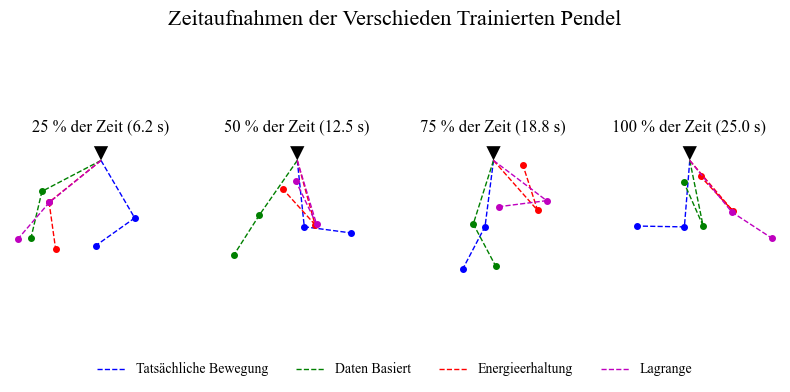

In [103]:
# ´Getting the specific angle from the dataframes
time = data_driven['time'].to_numpy()
ground_truth = data_driven[['theta1_actual', 'omega1_actual', 'theta2_actual', 'omega2_actual']].to_numpy()
data_driven_pred = data_driven[['theta1_predicted', 'omega1_predicted', 'theta2_predicted', 'omega2_predicted']].to_numpy()
energy_conversation_pred = energy_conservation[['theta1_predicted', 'omega1_predicted', 'theta2_predicted', 'omega2_predicted']].to_numpy()
lagrange_pred = lagrange[['theta1_predicted', 'omega1_predicted', 'theta2_predicted', 'omega2_predicted']].to_numpy()

# Determining indices for 25 %, 50 %, 75 % and 100 %
#Total timesteps
num_steps = ground_truth.shape[0] 
selected_indices = [int(num_steps * 0.25), int(num_steps * 0.50), int(num_steps * 0.75), int(num_steps - 1)]
time_25, time_50, time_75, time_100 = time[selected_indices]

comparison_models = [ground_truth, data_driven_pred, energy_conversation_pred, lagrange_pred]

#sharing the same axes x and y
fig, axes = plt.subplots(1, 4, figsize=(8, 4), sharex=True, sharey=True)
fig.suptitle("Zeitaufnahmen der Verschieden Trainierten Pendel", fontsize=16, y= 1)

plt.rcParams.update({'font.size': 10})
plt.rcParams.update({'font.family': 'Times New Roman'})

model_labels = ["Tatsächliche Bewegung", "Daten Basiert", "Energieerhaltung", "Lagrange"]
titles = [f"25 % der Zeit ({time_25:.1f} s)", f"50 % der Zeit ({time_50:.1f} s)", f"75 % der Zeit ({time_75:.1f} s)", f"100 % der Zeit ({time_100:.1f} s)"]

# Set colors for the models
colors = ['b', 'g', 'r', 'm']

for i, idx in enumerate(selected_indices):
    ax = axes[i]

    # creat the triangle mount of the pendulum in black k
    mountTriAngle_Coord = getMountTriangleCoord(0)
    ax.fill(mountTriAngle_Coord[0], mountTriAngle_Coord[1], 'k')

    for j, element in enumerate(comparison_models):
        M1, M2 = get_cartesian_coordinates(element)

        # M1 -> M2 (second bar)
        ax.plot([0, M1[0, idx], M2[0, idx]], [0, M1[1, idx], M2[1, idx]], colors[j] + '--', linewidth=1, label=f"{model_labels[j]}")

        # plot joints
        ax.plot(M1[0, idx], M1[1, idx], colors[j] + 'o', markersize=4)  # Joint 1
        ax.plot(M2[0, idx], M2[1, idx], colors[j] + 'o', markersize=4)  # Joint 2

    ax.set_aspect('equal')
    ax.set_title(titles[i])
    ax.set_axis_off()
    
    #remove the tics and labels of the axes
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel('')
    ax.set_ylabel('')


# legend outside of plotting area, applying to all
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.5, 0.15), ncol=len(model_labels), fontsize=10, frameon=False)

#fit the legend to the plot
plt.tight_layout(rect=[0, 0.1, 1, 1])

plt.show()

Subplot Versuch

In [104]:
print(type(time))
print(type(time_steps_smoothed))

<class 'numpy.ndarray'>
<class 'numpy.ndarray'>


In [105]:
def make_anim(data2, L1=1.4, L2=1):
    def init2():
        line21.set_data([], [])
        line22.set_data([], [])
        line23.set_data([], [])
        line24.set_data([], [])
        line25.set_data([], [])
        time_string.set_text('')
        return  line23,line24, line25, line21, line22, time_string

    def animate2(i):
        # Motion trail sizes. Defined in terms of indices. Length will vary with the time step, dt. E.g. 5 indices will span a lower distance if the time step is reduced.
        trail1 = 6              # length of motion trail of weight 1 
        trail2 = 8              # length of motion trail of weight 2

        dt = time[2]-time[1]          # time step

        line21.set_data(xp1[i:max(1,i-trail1):-1], yp1[i:max(1,i-trail1):-1])   # marker + line of first weight
        line22.set_data(xp2[i:max(1,i-trail2):-1], yp2[i:max(1,i-trail2):-1])   # marker + line of the second weight

        line23.set_data([xp1[i], xp2[i]], [yp1[i], yp2[i]])       # line connecting weight 2 to weight 1
        line24.set_data([xp1[i], 0], [yp1[i],0])                # line connecting origin to weight 1

        line25.set_data([0, 0], [0, 0])
        time_string.set_text(time_template % (i*dt))
        return  line23, line24,line25,line21, line22, time_string

    fig2 = plt.figure()
    ax2 = plt.axes(xlim=(-L1-L2-0.5, L1+L2+0.5), ylim=(-2.5, 1.5))
    #line, = ax.plot([], [], lw=2,,markersize = 9, markerfacecolor = "#FDB813",markeredgecolor ="#FD7813")
    line21, = ax2.plot([], [], 'o-',color = '#d2eeff',markersize = 12, markerfacecolor = '#0077BE',lw=2, markevery=10000, markeredgecolor = 'k')   # line for Earth
    line22, = ax2.plot([], [], 'o-',color = '#ffebd8',markersize = 12, markerfacecolor = '#f66338',lw=2, markevery=10000, markeredgecolor = 'k')   # line for Jupiter
    line23, = ax2.plot([], [], color='k', linestyle='-', linewidth=2)
    line24, = ax2.plot([], [], color='k', linestyle='-', linewidth=2)
    line25, = ax2.plot([], [], 'o', color='k', markersize = 10)
    time_template = 'Time = %.1f s'
    time_string = ax2.text(0.05, 0.9, '', transform=ax2.transAxes)
    ax2.get_xaxis().set_ticks([])    # enable this to hide x axis ticks
    ax2.get_yaxis().set_ticks([])    # enable this to hide y axis ticks

    u0 = data2[:,0]     # theta_1 
    u1 = data2[:,1]     # omega 1
    u2 = data2[:,2]     # theta_2 
    u3 = data2[:,3]     # omega_2 
    Nt = len(data2[:,0])
    xp1 = L1*np.sin(u0);          # First Pendulum
    yp1 = -L1*np.cos(u0);

    xp2 = xp1 + L2*np.sin(u2);     # Second Pendulum
    yp2 = yp1 - L2*np.cos(u2);

    anim2 = animation.FuncAnimation(fig2, animate2, init_func=init2,
                                   frames=Nt, interval=1000*(time[2]-time[1])*0.8, blit=True)
    return anim2

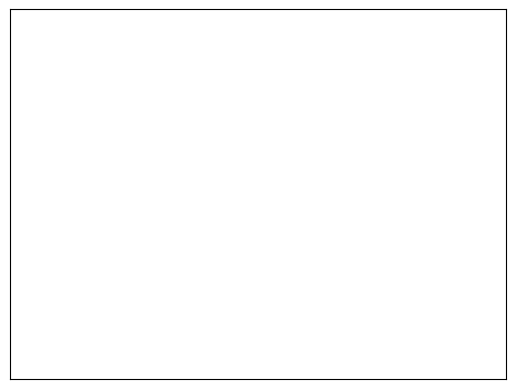

In [106]:
data = ground_truth
# data2 = actual_predictions
anim = make_anim(data)
# anim2 = make_anim(data2)

In [107]:
HTML(anim.to_jshtml())